<h1 style="background-color:black
;font-family:newtimeroman;font-size:225%;text-align:center; color:#40E0D0">Weather Predection Model </h1><a id=0></a>

# Project Overview

## Table of Contents

1. **Data Preparation**  
   - Loading the dataset  
   - Handling missing values and outliers  
   - Feature Engineering: Creating new features  
   - Handling imbalanced data using SMOTENC  

2. **Data Visualization**  
   - Exploring feature distributions with histograms  
   - Visualizing relationships between features using pairplots  
   - Plotting distribution of target variable (weather types)  
   - Correlation heatmap to understand feature interactions  

3. **Data Splitting**  
   - Splitting data into training, validation, and test sets  
   - Stratified splitting to maintain class distribution  

4. **Model Building**  
   - Constructing a deep learning model using Keras  
   - Adding layers with regularization, normalization, and dropout  
   - Model summary for architecture details  

5. **Model Training**  
   - Compiling the model with Adam optimizer and loss function  
   - Implementing callbacks for early stopping, learning rate reduction, and model checkpoint  
   - Training the model on the SMOTE-sampled data  

6. **Model Evaluation**  
   - Plotting accuracy and loss curves for both training and validation sets  
   - Evaluating model performance using confusion matrix and classification report for validation and test sets  

---

This project involves building and evaluating a deep learning model to classify weather categories based on various features such as temperature, precipitation, and humidity. We address challenges such as imbalanced data and feature selection, and evaluate the model's performance using common classification metrics.


## importing the liberaries 

In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, BatchNormalization,LeakyReLU
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from sklearn.utils.class_weight import compute_class_weight
import tensorflow as tf
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import ADASYN





## EDA

In [2]:
#reading the data
data= pd.read_csv("seattle-weather.csv")

In [3]:
data

,date,precipitation,temp_max,temp_min,wind,weather
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle
1,2012-01-02,10.9,10.6,2.8,4.5,rain
2,2012-01-03,0.8,11.7,7.2,2.3,rain
3,2012-01-04,20.3,12.2,5.6,4.7,rain
4,2012-01-05,1.3,8.9,2.8,6.1,rain
...,...,...,...,...,...,...
1456,2015-12-27,8.6,4.4,1.7,2.9,rain
1457,2015-12-28,1.5,5.0,1.7,1.3,rain
1458,2015-12-29,0.0,7.2,0.6,2.6,fog
1459,2015-12-30,0.0,5.6,-1.0,3.4,sun


In [4]:
#displaying the information about the data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1461 entries, 0 to 1460
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   date           1461 non-null   object 
 1   precipitation  1461 non-null   float64
 2   temp_max       1461 non-null   float64
 3   temp_min       1461 non-null   float64
 4   wind           1461 non-null   float64
 5   weather        1461 non-null   object 
dtypes: float64(4), object(2)
memory usage: 68.6+ KB


In [5]:
data.describe()

,precipitation,temp_max,temp_min,wind
count,1461.000000,1461.000000,1461.000000,1461.000000
mean,3.029432,16.439083,8.234771,3.241136
std,6.680194,7.349758,5.023004,1.437825
min,0.000000,-1.600000,-7.100000,0.400000
25%,0.000000,10.600000,4.400000,2.200000
50%,0.000000,15.600000,8.300000,3.000000
75%,2.800000,22.200000,12.200000,4.000000
max,55.900000,35.600000,18.300000,9.500000


### Ordinal Encoding for the `weather` Column

In [6]:
#showing the weather catigories before encoding 
weather_catigories = set(data.weather)
print (f"weather catigories before transfer it : {weather_catigories}")


# Step 1: Create a mapping for the ordinal values
weather_order = {
    'sun': 0,       # Least severe weather condition
    'fog': 1,       # Slightly severe
    'drizzle': 2,   # Moderate severity
    'rain': 3,      # High severity
    'snow': 4       # Highest severity
}

# Step 2: Map the 'weather' column to ordinal values
data['weather_encoded'] = data['weather'].map(weather_order)

# Display the changes
print(data[['weather', 'weather_encoded']].head())

weather catigories before transfer it : {'drizzle', 'snow', 'fog', 'rain', 'sun'}
   weather  weather_encoded
0  drizzle                2
1     rain                3
2     rain                3
3     rain                3
4     rain                3


The `weather` column contains categorical values like `sun`, `fog`, `drizzle`, `rain`, and `snow`. These categories represent weather conditions and have an inherent order based on their severity. For instance:
- `sun` is the least severe weather condition.
- `snow` is the most severe condition.

To capture this order, we use **Ordinal Encoding** instead of Label Encoding. Ordinal Encoding assigns numerical values to the categories based on their order of severity.

Here is the mapping we used for encoding:
- `sun`: 0
- `fog`: 1
- `drizzle`: 2
- `rain`: 3
- `snow`: 4

By encoding the `weather` column in this way, we ensure that the model understands the logical relationship between these categories.


## Data Cleaning 

### Step 1: Handling Missing Values

Missing values, also known as null values, can lead to errors during data analysis and training machine learning models. Before proceeding, we need to:
1. Identify where missing values exist.
2. Decide on the best strategy to handle them:
   - Remove rows/columns with too many nulls.
   - Fill nulls with appropriate values, such as the mean, median, or a placeholder.

The strategy depends on:
- The proportion of missing values.
- The importance of the column to the analysis/model.

In [7]:
#showing the data after 
data.head()

,date,precipitation,temp_max,temp_min,wind,weather,weather_encoded
0,2012-01-01,0.0,12.8,5.0,4.7,drizzle,2
1,2012-01-02,10.9,10.6,2.8,4.5,rain,3
2,2012-01-03,0.8,11.7,7.2,2.3,rain,3
3,2012-01-04,20.3,12.2,5.6,4.7,rain,3
4,2012-01-05,1.3,8.9,2.8,6.1,rain,3


In [8]:
# Step 1: Check for missing values in the dataset
missing_values = data.isnull().sum()
print("Missing Values Per Column:\n", missing_values)

# Step 2: Calculate the percentage of missing values
missing_percentage = (missing_values / len(data)) * 100
print("\nPercentage of Missing Values:\n", missing_percentage)

# Combine both into a DataFrame for better visualization
missing_summary = pd.DataFrame({
    'Missing Values': missing_values,
    'Percentage': missing_percentage
})
print("\nMissing Values Summary:\n", missing_summary)


Missing Values Per Column:
 date               0
precipitation      0
temp_max           0
temp_min           0
wind               0
weather            0
weather_encoded    0
dtype: int64

Percentage of Missing Values:
 date               0.0
precipitation      0.0
temp_max           0.0
temp_min           0.0
wind               0.0
weather            0.0
weather_encoded    0.0
dtype: float64

Missing Values Summary:
                  Missing Values  Percentage
date                          0         0.0
precipitation                 0         0.0
temp_max                      0         0.0
temp_min                      0         0.0
wind                          0         0.0
weather                       0         0.0
weather_encoded               0         0.0


### Step 2: Handling Outliers

Outliers are extreme values that deviate significantly from the rest of the data. They can result from errors in data collection, measurement, or naturally occurring phenomena. Detecting and handling outliers ensures that the data:
1. Accurately represents the underlying distribution.
2. Does not distort model training or predictions.

#### Steps to Handle Outliers:
1. **Detect Outliers**:
   - Using boxplots.
   - Statistical methods like the Interquartile Range (IQR) or Z-scores.
2. **Handle Outliers**:
   - Remove them if they result from errors.
   - Cap them if they are extreme but valid.
   - Leave them unchanged if they are essential to the analysis.


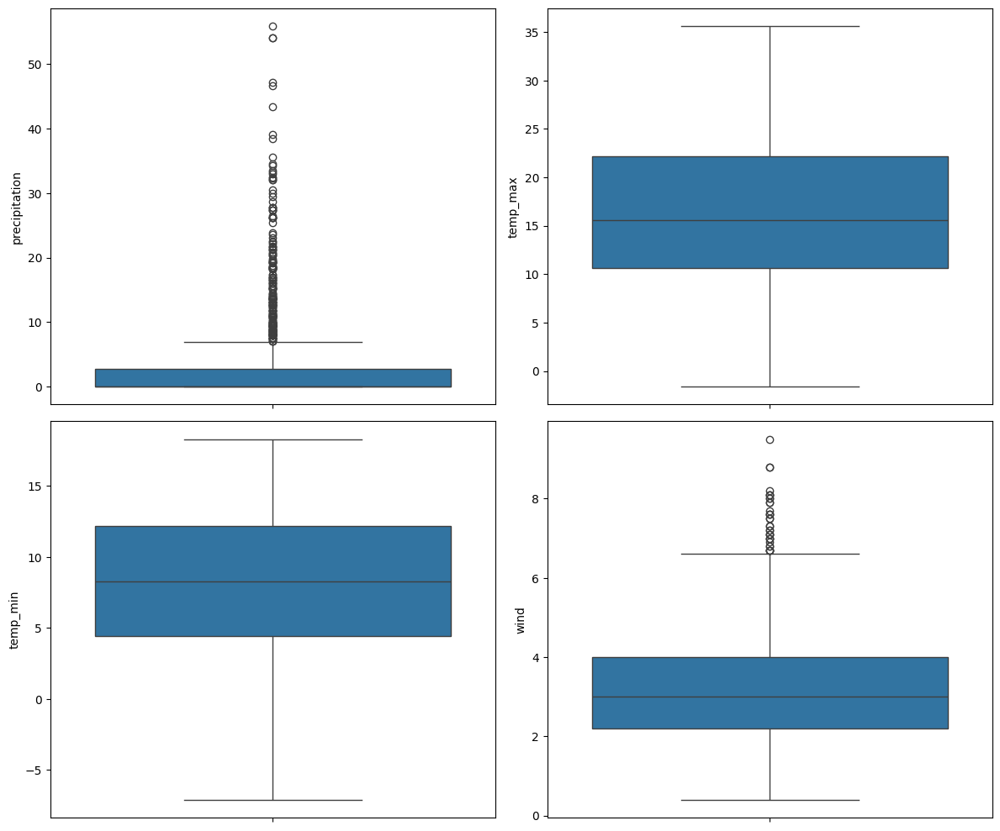

In [9]:
# Visualizing outliers with boxplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
sns.boxplot(data=data['precipitation'], ax=axes[0, 0])
sns.boxplot(data=data['temp_max'], ax=axes[0, 1])
sns.boxplot(data=data['temp_min'], ax=axes[1, 0])
sns.boxplot(data=data['wind'], ax=axes[1, 1])
plt.tight_layout()
plt.show()



In [10]:
# Function to detect outliers using IQR
def detect_outliers_iqr(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile (25th percentile)
    Q3 = df[column].quantile(0.75)  # Third quartile (75th percentile)
    IQR = Q3 - Q1  # Interquartile Range
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]
    return outliers, lower_bound, upper_bound
print (data.columns)
# Check for outliers in numerical columns
numerical_cols=['precipitation', 'temp_max', 'temp_min', 'wind' ]

for col in numerical_cols:
    outliers, lower, upper = detect_outliers_iqr(data, col)
    print(f"Column: {col}")
    print(f"Lower Bound: {lower}, Upper Bound: {upper}")
    print(f"Number of Outliers: {len(outliers)}\n")


Index(['date', 'precipitation', 'temp_max', 'temp_min', 'wind', 'weather',
       'weather_encoded'],
      dtype='object')
Column: precipitation
Lower Bound: -4.199999999999999, Upper Bound: 6.999999999999999
Number of Outliers: 206

Column: temp_max
Lower Bound: -6.799999999999999, Upper Bound: 39.599999999999994
Number of Outliers: 0

Column: temp_min
Lower Bound: -7.299999999999999, Upper Bound: 23.9
Number of Outliers: 0

Column: wind
Lower Bound: -0.49999999999999956, Upper Bound: 6.699999999999999
Number of Outliers: 34



### **Outlier Analysis and Data Normalization**

#### **Analysis Overview**
- **Precipitation**: Found 206 outliers (extreme rainfall values), naturally expected in weather data.
- **Wind**: Detected 34 outliers, representing strong winds or storms.
- **Temperature**: No significant outliers in `temp_max` or `temp_min`.

#### **Key Insights**
- Outliers in `precipitation` and `wind` are **not errors** but represent natural extreme conditions.
- Removing these outliers may lead to a loss of critical information about weather patterns.

#### **Decision**
- **Normalization and Clipping** were applied to the data:
  - **Normalization** was applied to scale values to a uniform range (e.g., 0 to 1) to ensure all features contribute equally during model training.
  - **Clipping** was specifically applied to the `precipitation` feature to handle extreme outliers using the Interquartile Range (IQR) method.
  - The extreme outliers in `precipitation` were clipped to a range defined by 10 times the IQR, while other features remained unaffected.


In [11]:
# Calculating IQR for precipitation
Q1 = data['precipitation'].quantile(0.25)
Q3 = data['precipitation'].quantile(0.75)
IQR = Q3 - Q1

# Defining bounds for extreme outliers (10 * IQR range)
lower = Q1 - 10* IQR
upper = Q3 + 10* IQR

# Applying clip only to extreme outliers in precipitation
data['precipitation'] = np.where(
    (data['precipitation'] < lower) | (data['precipitation'] > upper), 
    np.clip(data['precipitation'], lower, upper),
    data['precipitation']
)


## **Feature Extraction from Date Column**

### **Overview**

The date column in our dataset contains valuable temporal information that can help improve the model's performance. Instead of treating it as a simple text column, we will extract meaningful features from it, such as the day, month, year, and other derived attributes. These features can capture seasonal patterns, long-term trends, and periodic changes.

### **Steps**

**Convert the Date Column:** Ensure the date column is in datetime format.

**Extract Features:**

**Day (day):** Day of the month.

**Month (month):** Month.

**Year (year):** Year.

**Day of the Week (day_of_week):** Day of the week (0=Monday, 6=Sunday).

**Quarter (quarter):** Quarter of the year (e.g., Q1 = Jan-Mar).

**Remove Redundancy:** Drop the original date column

In [12]:
# Convert 'date' column to datetime format
data['date'] = pd.to_datetime(data['date'])

# Extract features from the 'date' column
data['day'] = data['date'].dt.day        # Day of the month
data['month'] = data['date'].dt.month    # Month
data['year'] = data['date'].dt.year      # Year 
data['quarter'] = data['date'].dt.quarter        # Quarter of the year

# Drop the original 'date' column
data = data.drop(columns=['date'])


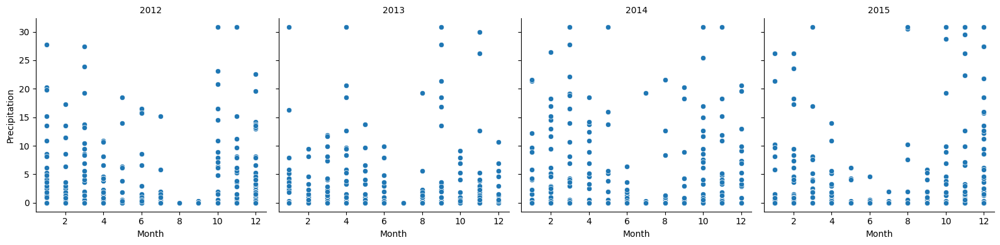

In [13]:
g = sns.FacetGrid(data, col='year', col_wrap=4, height=4)
g.map(sns.scatterplot, 'month', 'precipitation')
g.set_axis_labels('Month', 'Precipitation')
g.set_titles(col_template="{col_name}")
plt.show()

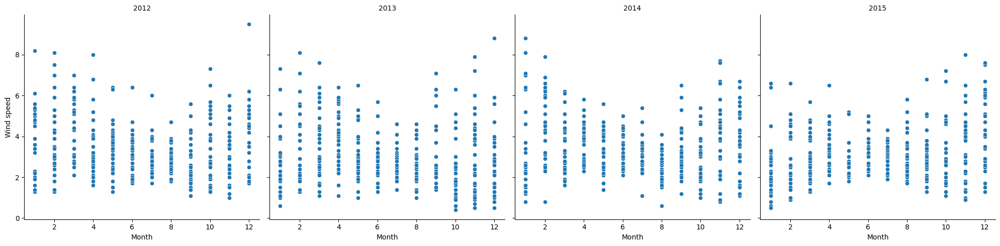

In [14]:
g = sns.FacetGrid(data, col='year', col_wrap=4, height=5)
g.map(sns.scatterplot, 'month', 'wind')
g.set_axis_labels('Month', 'Wind speed')
g.set_titles(col_template="{col_name}")
plt.show()

### **Feature Extraction for Weather Conditions**

#### **Analysis Overview**
- **Sunny Data**: Extracted data where weather is labeled as "sun" and analyzed using `describe()` to understand key statistics.
- **Snow Data**: Similarly, extracted data where weather is labeled as "snow" and performed a `describe()` analysis.

#### **Feature Engineering**
- **Heatwave Detection**: Created a new feature `is_heatwave` by checking if the `temp_min` is greater than or equal to 18°C.
- **Frost Detection**: Created another feature `is_frost` by checking if the `temp_min` is below 7°C.

#### **Key Insights**
- The new features `is_heatwave` and `is_frost` are based on temperature thresholds derived from the analysis of sunny and snow data, helping to capture extreme weather conditions.



In [15]:
sunny_data=data.loc[data["weather"]=="sun"]
snnoy_data=data.loc[data["weather"]=="snow"]

In [16]:
sunny_data.describe()

,precipitation,temp_max,temp_min,wind,weather_encoded,day,month,year,quarter
count,640.0,640.000000,640.000000,640.000000,640.0,640.000000,640.000000,640.000000,640.000000
mean,0.0,19.861875,9.343750,2.956406,0.0,15.268750,6.667187,2013.614063,2.556250
std,0.0,7.698258,5.508277,1.164077,0.0,8.940752,2.811810,1.055334,0.924349
min,0.0,-1.600000,-7.100000,0.400000,0.0,1.000000,1.000000,2012.000000,1.000000
25%,0.0,14.400000,5.600000,2.200000,0.0,7.000000,5.000000,2013.000000,2.000000
50%,0.0,21.100000,10.600000,2.800000,0.0,15.000000,7.000000,2014.000000,3.000000
75%,0.0,25.600000,13.900000,3.600000,0.0,23.000000,9.000000,2015.000000,3.000000
max,0.0,35.000000,18.300000,7.700000,0.0,31.000000,12.000000,2015.000000,4.000000


In [17]:
data['is_heatwave'] = data['temp_min']>=18

In [18]:
snnoy_data.describe()

,precipitation,temp_max,temp_min,wind,weather_encoded,day,month,year,quarter
count,26.000000,26.000000,26.000000,26.000000,26.0,26.000000,26.000000,26.000000,26.000000
mean,8.553846,5.573077,0.146154,4.411538,4.0,17.346154,4.653846,2012.269231,1.846154
std,7.021523,3.109155,2.237182,1.440369,0.0,6.492718,4.542619,0.603834,1.347362
min,0.300000,-1.100000,-4.300000,1.600000,4.0,5.000000,1.000000,2012.000000,1.000000
25%,3.600000,4.025000,-0.975000,3.475000,4.0,14.250000,1.000000,2012.000000,1.000000
50%,5.450000,5.600000,0.600000,4.950000,4.0,17.000000,3.000000,2012.000000,1.000000
75%,13.500000,8.025000,0.975000,5.300000,4.0,20.000000,9.250000,2012.000000,3.500000
max,23.900000,11.100000,5.600000,7.000000,4.0,29.000000,12.000000,2014.000000,4.000000


In [19]:
data['is_frost'] = data['temp_min'] < 7


###  Relative Humidity (RH)

In this step, we extract a new feature: **Relative Humidity (RH)** using maximum (`temp_max`) and minimum (`temp_min`) temperatures.  
The calculation is based on the **Magnus-Tetens approximation**, and the resulting RH values are added as a new column `humidity` in the dataset.

- Formula: RH = 100 * (exp((17.625 * temp_min) / (243.04 + temp_min)) / exp((17.625 * temp) / (243.04 + temp))).  
- The `apply()` function is used to compute RH for each row in the dataset.


In [20]:
def calculate_rh(temp, temp_min):
    """
    Calculate relative humidity (RH) using maximum and minimum temperatures.
    
    Parameters:
        temp (float): Maximum temperature (in Celsius).
        temp_min (float): Minimum temperature (in Celsius).
    
    Returns:
        float: Relative humidity (in percentage).
    """
    # Calculate RH using the Magnus-Tetens approximation
    rh = 100 * (np.exp((17.625 * temp_min) / (243.04 + temp_min)) / np.exp((17.625 * temp) / (243.04 + temp)))
    return rh

# Apply the function to the DataFrame
data['humidity'] = data.apply(lambda row: calculate_rh(row['temp_max'], row['temp_min']), axis=1)

### **Feature Engineering for Interactions and Lags**

#### **Feature Creation**
- **Temp-Precipitation Interaction**: Created `temp_precip_interaction` by multiplying `precipitation` with `temp_max`, capturing the relationship between rainfall and maximum temperature.
- **Precip-Wind Interaction**: Created `precip_wind_interaction` by multiplying `precipitation` with `wind`, capturing how rainfall interacts with wind speed.
- **Average Temperature**: Created `avg_temp` as the average of `temp_max` and `temp_min`, representing the general temperature for the day.
- **Temperature Range**: Created `rang_temp` by subtracting `temp_min` from `temp_max`, representing the temperature variation during the day.

#### **Lag Features**
- **Lag Features for Precipitation, Temp, and Weather**:
  - Created lag features `precipitation_lag_1`, `temp_max_lag_1`, and `weather_lag_1` to represent the previous day's values for these columns, enabling the model to account for temporal dependencies.

#### **Key Insights**
- The new features are designed to capture interactions between weather elements (e.g., temperature and precipitation) and temporal dependencies (lag features), potentially improving model performance in forecasting weather patterns.


In [21]:
data["temp_precip_interaction"]=data["precipitation"]*data["temp_max"]
data['precip_wind_interaction'] = data['precipitation'] * data['wind']
data["avg_temp"]=(data["temp_max"]+data["temp_min"])/2
data["rang_temp"]=data["temp_max"]-data["temp_min"]
data['precipitation_lag_1'] = data['precipitation'].shift(1)
data['temp_max_lag_1'] = data['temp_max'].shift(1)
data['weather_lag_1'] = data['weather_encoded'].shift(1)

In [22]:
data.columns

Index(['precipitation', 'temp_max', 'temp_min', 'wind', 'weather',
       'weather_encoded', 'day', 'month', 'year', 'quarter', 'is_heatwave',
       'is_frost', 'humidity', 'temp_precip_interaction',
       'precip_wind_interaction', 'avg_temp', 'rang_temp',
       'precipitation_lag_1', 'temp_max_lag_1', 'weather_lag_1'],
      dtype='object')

In [23]:
#Now we normalize all features 
# List of columns to normalize
columns_to_normalize = ['precipitation', 'temp_max', 'temp_min', 'wind','day',  'month', 'year', 'quarter',
       'humidity', 'temp_precip_interaction', 'precip_wind_interaction',
       'is_frost', 'is_heatwave',"temp_max_lag_1",'avg_temp', 'rang_temp',"precipitation_lag_1","weather_lag_1"]

# Apply normalization
scaler = MinMaxScaler()
data[columns_to_normalize] = scaler.fit_transform(data[columns_to_normalize])

### **Handling Missing Values**

#### **Data Cleaning**
- **Removing Missing Values**: Dropped rows with missing values in the lag features (`precipitation_lag_1`, `temp_max_lag_1`, `weather_lag_1`) using `dropna()`, since these features depend on the previous day's data and result in NaN for the first row.
  
#### **Key Insight**
- This step ensures that missing values are handled appropriately by removing rows where critical lag features are missing, maintaining data integrity for model training.



In [24]:
data = data.dropna(subset=['precipitation_lag_1', 'temp_max_lag_1', 'weather_lag_1'])
data.isna().sum()

precipitation              0
temp_max                   0
temp_min                   0
wind                       0
weather                    0
weather_encoded            0
day                        0
month                      0
year                       0
quarter                    0
is_heatwave                0
is_frost                   0
humidity                   0
temp_precip_interaction    0
precip_wind_interaction    0
avg_temp                   0
rang_temp                  0
precipitation_lag_1        0
temp_max_lag_1             0
weather_lag_1              0
dtype: int64

### **Visualizing Outliers with Boxplots**

#### **Outlier Visualization**
- Used **boxplots** to visualize the distribution of key weather features (`precipitation`, `temp_max`, `temp_min`, `wind`) and identify any remaining outliers after applying **normalization** and **clipping**.
- The boxplots were generated for each feature to confirm how the outlier handling techniques impacted the data distribution.

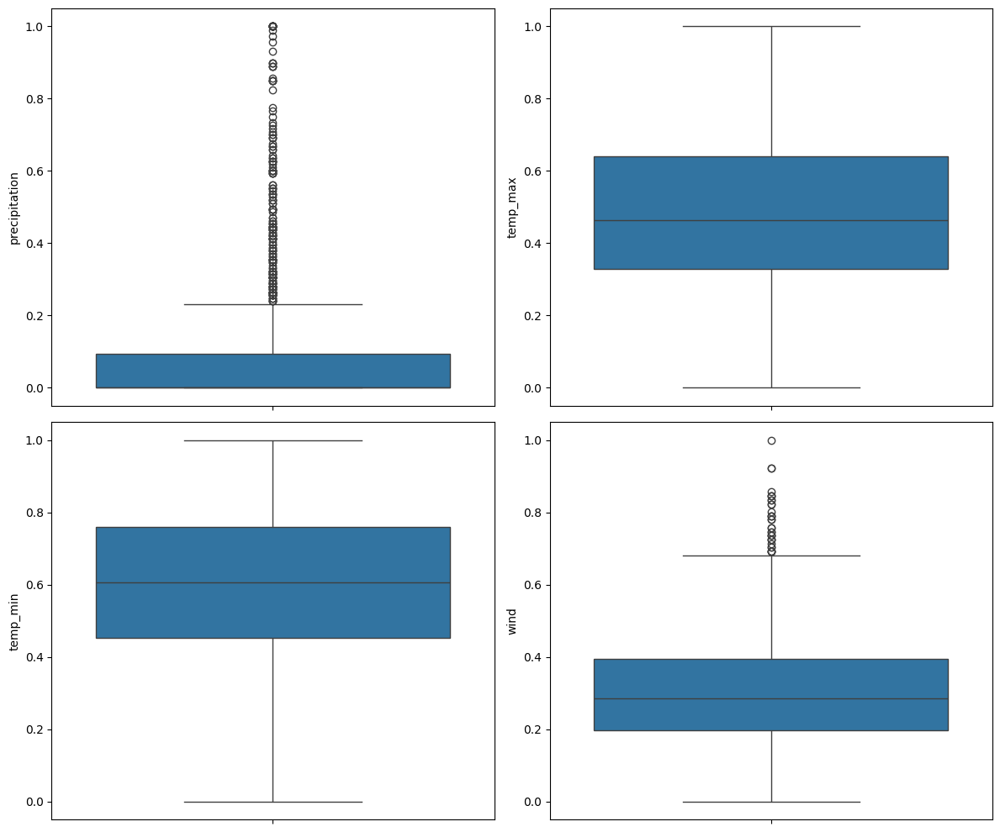

In [25]:
# Visualizing outliers with boxplots
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
sns.boxplot(data=data['precipitation'], ax=axes[0, 0])
sns.boxplot(data=data['temp_max'], ax=axes[0, 1])
sns.boxplot(data=data['temp_min'], ax=axes[1, 0])
sns.boxplot(data=data['wind'], ax=axes[1, 1])
plt.tight_layout()
plt.show()



### **Visualizing Feature Distributions**

#### **Feature Distribution Visualization**
- Created **histograms** with Kernel Density Estimation (KDE) for a variety of weather-related features, including `precipitation`, `temp_max`, `temp_min`, `wind`, and others.
- The histograms display the distribution and frequency of each feature, providing insights into their underlying patterns and any skewness in the data.
  
#### **Key Insight**
- Visualizing these distributions helps in understanding the spread of values for each feature, ensuring that the data is well-represented before model training. It also allows for detecting any imbalances or unusual patterns in the features.



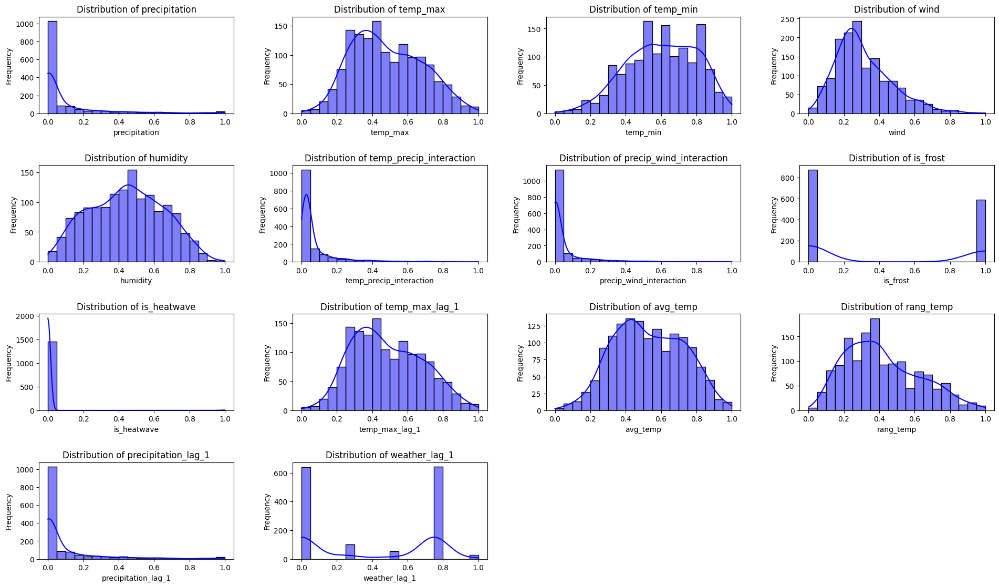

In [26]:
# Define the columns to plot
columns_to_plot = ['precipitation', 'temp_max', 'temp_min', 'wind','humidity', 'temp_precip_interaction', 'precip_wind_interaction',
                   'is_frost', 'is_heatwave',"temp_max_lag_1",'avg_temp', 'rang_temp',"precipitation_lag_1","weather_lag_1"]

# Number of columns in each row and number of rows in the plot
num_cols = 4  # Number of columns per row
num_rows = -(-len(columns_to_plot) // num_cols)  # Calculate the number of rows, rounding up

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 12))
fig.tight_layout(pad=5.0)

# Plot histograms for each feature
for i, col in enumerate(columns_to_plot):
    row, col_pos = divmod(i, num_cols)
    sns.histplot(data[col], kde=True, bins=20, color='blue', ax=axes[row, col_pos])
    axes[row, col_pos].set_title(f"Distribution of {col}")
    axes[row, col_pos].set_xlabel(col)
    axes[row, col_pos].set_ylabel("Frequency")

# Remove any empty axes if they exist
for j in range(i + 1, num_rows * num_cols):
    fig.delaxes(axes.flat[j])

plt.show()


### **Pairplot of Features by Weather Categories**

#### **Feature Relationships Visualization**
- Used **pairplot** from Seaborn to visualize the relationships between features, colored by `weather_encoded` categories.
- The diagonal shows the **Kernel Density Estimation (KDE)** of each feature, while the off-diagonal plots show pairwise relationships between features.
- The **'viridis'** color palette was used to distinguish different weather categories.

#### **Key Insight**
- This visualization helps to identify potential correlations between features and how they vary across different weather conditions, assisting in understanding feature interactions for model development.



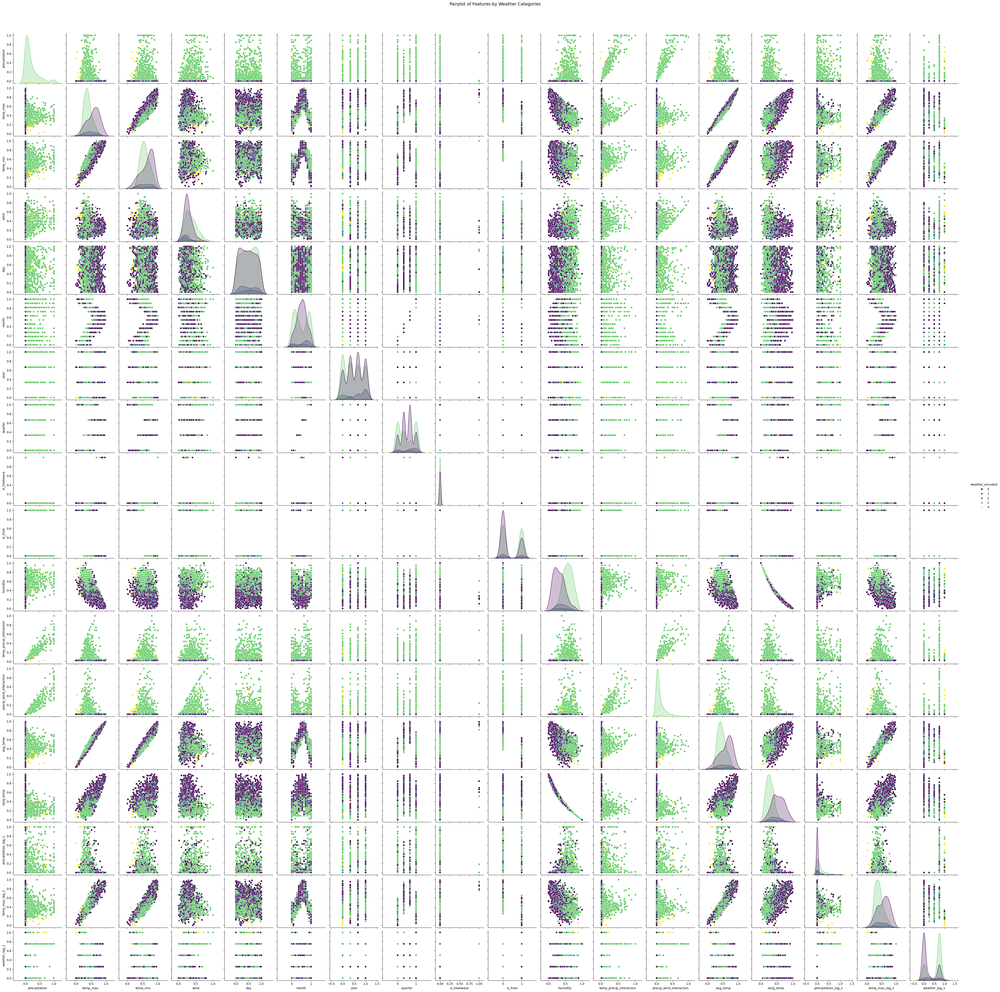

In [27]:
sns.pairplot(data, hue='weather_encoded', palette='viridis', diag_kind='kde')
plt.suptitle('Pairplot of Features by Weather Categories', y=1.02, fontsize=14)
plt.show()




#### **Weather Type Distribution**
- We visualized the distribution of weather types in the dataset using a pie chart.
- The distribution shows that the data is **imbalanced**, with the following proportions:
  - **Rain**: 43.9%
  - **Sun**: 43.8%
  - **Fog**: 6.9%
  - **Drizzle**: 3.6%
  - **Snow**: 1.8%

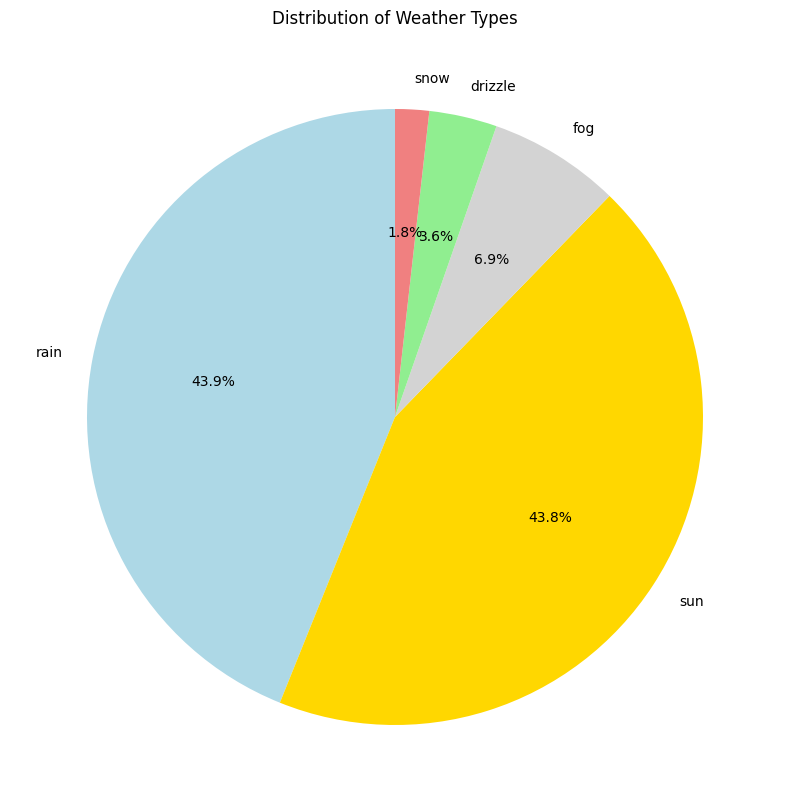

In [28]:
x=data.weather.value_counts()
plt.figure(figsize=(12, 10))
plt.pie(x, labels=x.index, autopct='%1.1f%%', startangle=90, colors=['lightblue', 'gold', 'lightgray', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Weather Types')
plt.show()

## Correlation Heatmap for Numerical Features

A heatmap is used to visualize the correlation between numerical features in the dataset. This helps identify relationships between variables, such as strong positive or negative correlations, which can provide insights for feature selection or engineering. Non-numerical columns (e.g., `weather`) are excluded to focus on numerical data only.


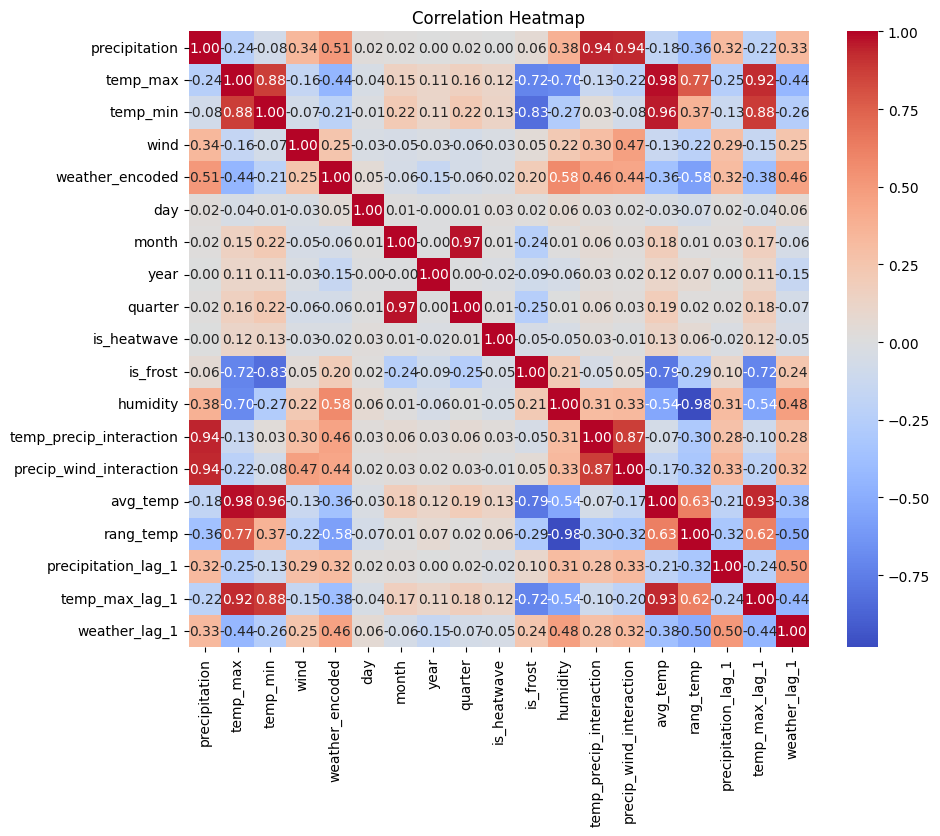

In [29]:
# Dropping the non-numerical column
numerical_data = data.drop(columns=['weather'])
# Correlation Heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(numerical_data.corr(), annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()


## preparing and spliting the data
#### **Purpose**
- The dataset was split into training, validation, and test sets to prepare for model training and evaluation.
- SMOTE-NC (Synthetic Minority Over-sampling Technique for Nominal and Continuous features) was applied to handle the class imbalance in the target variable `weather_encoded`.

#### **Steps**
1. **Splitting the Data**:
    - The data was split into training (60%), validation (20%), and test (20%) sets.
    - The `stratify=y` argument ensures that each set maintains the same distribution of the target variable.

2. **Handling Imbalance with SMOTE-NC**:
    - Since the target variable (`weather_encoded`) was imbalanced, SMOTE-NC was used to oversample the minority classes.
    - The categorical features were specified as `is_frost`, `is_heatwave`, `month`, `year`, and `quarter`.

In [30]:
from imblearn.over_sampling import SMOTENC
from sklearn.model_selection import train_test_split

# Features and target
X = numerical_data.drop(columns=['weather_encoded'])  # Replace 'weather_encoded' with your target column name
y = numerical_data['weather_encoded']  # Replace with your target column name

# Splitting data: 60% training, 20% validation, 20% testing
x_train, x_, y_train, y_ = train_test_split(X, y, test_size=0.60, random_state=1, stratify=y)
x_val, x_test, y_val, y_test = train_test_split(x_, y_, test_size=0.50, random_state=1, stratify=y_)

# Specify which columns are categorical (indices of categorical columns in X)
categorical_features_indices = [X.columns.get_loc(col) for col in ['is_frost', 'is_heatwave',  'month', 'year',"quarter"]]  # Replace with your actual categorical column names

# Apply SMOTE-NC
smote_nc = SMOTENC(categorical_features=categorical_features_indices, random_state=1)
X_train_smote, y_train_smote = smote_nc.fit_resample(x_train, y_train)

# Delete temporary variables
del x_, y_

# Shapes of the splits
print(f"Training set (input): {X_train_smote.shape}, Target: {y_train_smote.shape}")
print(f"Validation set (input): {x_val.shape}, Target: {y_val.shape}")
print(f"Test set (input): {x_test.shape}, Target: {y_test.shape}")


Training set (input): (1280, 18), Target: (1280,)
Validation set (input): (438, 18), Target: (438,)
Test set (input): (438, 18), Target: (438,)


In [31]:
#displaying the value counts of the targer data
print (f"training target data value counts : \n {y_train_smote.value_counts()}",end="\n\n")
print (f"validation target data value counts : \n {y_val.value_counts()}",end="\n\n")
print (f"testing  target data value counts : \n {y_test.value_counts()}")


training target data value counts : 
 weather_encoded
0    256
3    256
1    256
2    256
4    256
Name: count, dtype: int64

validation target data value counts : 
 weather_encoded
3    193
0    192
1     30
2     15
4      8
Name: count, dtype: int64

testing  target data value counts : 
 weather_encoded
0    192
3    192
1     31
2     16
4      7
Name: count, dtype: int64


### **Building the Neural Network Model**

#### **Purpose**
- We are constructing a neural network model using Keras to classify the `weather_encoded` target variable. The model is designed with several dense layers, regularization techniques, and batch normalization to improve performance and reduce overfitting.

#### **Model Architecture**
1. **Input Layer**:
   - The input layer has 512 units with ReLU activation, and it takes the input dimensions equal to the number of features in the training dataset (`X_train_smote.shape[1]`).
   - **Regularization**: L2 regularization is applied with a strength of 0.05 to reduce overfitting.

2. **Hidden Layers**:
   - The network has several dense layers (256, 128, 64, and 32 units), each with ReLU activation and L2 regularization.
   - **Batch Normalization**: Applied after each dense layer to stabilize and speed up the training process.
   - **Dropout**: A dropout rate of 0.2 is applied after each layer to prevent overfitting by randomly setting 20% of the input units to zero during training.

3. **Output Layer**:
   - The output layer has a number of units equal to the number of unique target classes (`len(np.unique(y_train_smote))`) and uses a linear activation function for regression or multi-class classification.


In [44]:
model = Sequential([
    Dense(512, activation='relu', input_dim=X_train_smote.shape[1], kernel_regularizer=l2(0.05)),
    BatchNormalization(),
    Dropout(0.2),

    Dense(256, activation='relu', kernel_regularizer=l2(0.05)),
    BatchNormalization(),
    Dropout(0.2),

    Dense(128, activation='relu', kernel_regularizer=l2(0.05)),
    BatchNormalization(),
    Dropout(0.2),
    
    Dense(64, activation='relu', kernel_regularizer=l2(0.05)),
    BatchNormalization(),
    Dropout(0.1),

    Dense(32, activation='relu', kernel_regularizer=l2(0.05)),
    BatchNormalization(),

    Dense(len(np.unique(y_train_smote)), activation='linear')  
])

# Model Summary
model.summary()  



Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_24 (Dense)            (None, 512)               9728      
                                                                 
 batch_normalization_20 (Bat  (None, 512)              2048      
 chNormalization)                                                
                                                                 
 dropout_13 (Dropout)        (None, 512)               0         
                                                                 
 dense_25 (Dense)            (None, 256)               131328    
                                                                 
 batch_normalization_21 (Bat  (None, 256)              1024      
 chNormalization)                                                
                                                                 
 dropout_14 (Dropout)        (None, 256)              

### Model Compilation and Training

In [45]:
# Compile the model
model.compile(
    optimizer=Adam(learning_rate=0.0005),
    loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

early_stopping = EarlyStopping(monitor='val_loss', patience=20, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=1e-8)
model_checkpoint = ModelCheckpoint("Claimate_pred5.h5", monitor="val_loss", save_best_only=True)


# Train the model
history = model.fit(
    X_train_smote,y_train_smote,
    validation_data=(x_val, y_val),
    epochs=150,
    batch_size=16,
    verbose=1,
    callbacks=[early_stopping, reduce_lr,model_checkpoint]
)

Epoch 1/150
80/80 [==============================] - 2s 14ms/step - loss: 30.7175 - accuracy: 0.5227 - val_loss: 27.0374 - val_accuracy: 0.4406 - lr: 5.0000e-04
Epoch 2/150
80/80 [==============================] - 1s 9ms/step - loss: 23.1020 - accuracy: 0.6547 - val_loss: 20.7057 - val_accuracy: 0.4406 - lr: 5.0000e-04
Epoch 3/150
80/80 [==============================] - 1s 9ms/step - loss: 17.5521 - accuracy: 0.6984 - val_loss: 15.9475 - val_accuracy: 0.4406 - lr: 5.0000e-04
Epoch 4/150
80/80 [==============================] - 1s 8ms/step - loss: 13.4517 - accuracy: 0.7188 - val_loss: 12.3681 - val_accuracy: 0.4406 - lr: 5.0000e-04
Epoch 5/150
80/80 [==============================] - 1s 10ms/step - loss: 10.3435 - accuracy: 0.7437 - val_loss: 9.6791 - val_accuracy: 0.4406 - lr: 5.0000e-04
Epoch 6/150
80/80 [==============================] - 1s 11ms/step - loss: 8.0910 - accuracy: 0.7344 - val_loss: 7.5889 - val_accuracy: 0.4772 - lr: 5.0000e-04
Epoch 7/150
80/80 [=====================

### Plotting Model Performance:

- **Accuracy Plot**: Compares training and validation accuracy over epochs.
- **Loss Plot**: Compares training and validation loss over epochs.


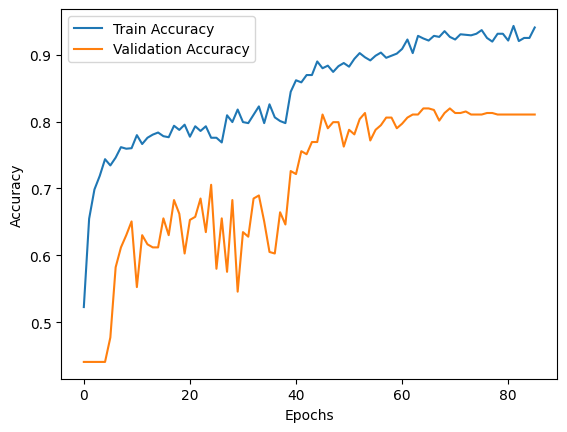

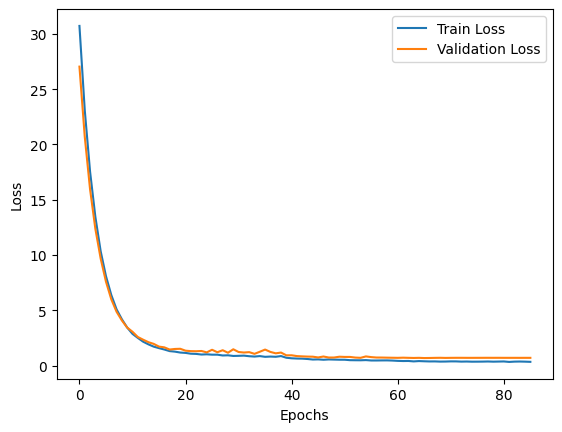

In [46]:
# Plot accuracy
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plot loss
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

### Evaluation Metrics:

- **Confusion Matrix**: Shows the performance of the model by comparing actual vs. predicted classes for both validation and test sets.
- **Classification Report**: Displays precision, recall, F1-score, and support for each class in the validation and test sets.

This step evaluates the model's accuracy in predicting different weather categories.

14/14 [==============================] - 0s 4ms/step


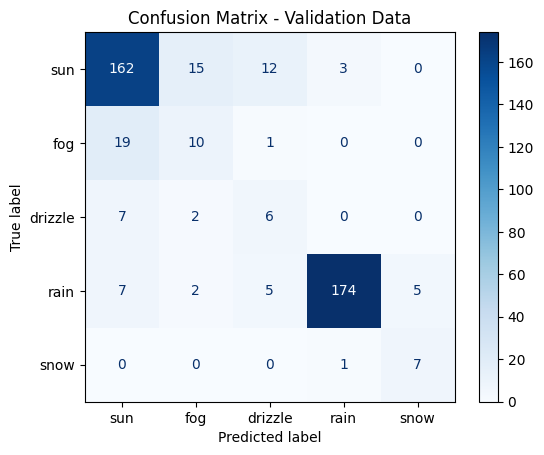

Classification Report - Validation Data
              precision    recall  f1-score   support

         sun       0.83      0.84      0.84       192
         fog       0.34      0.33      0.34        30
     drizzle       0.25      0.40      0.31        15
        rain       0.98      0.90      0.94       193
        snow       0.58      0.88      0.70         8

    accuracy                           0.82       438
   macro avg       0.60      0.67      0.62       438
weighted avg       0.84      0.82      0.83       438



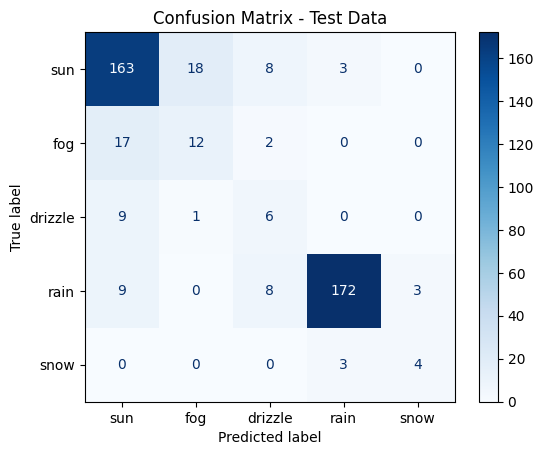

Classification Report - Test Data
              precision    recall  f1-score   support

         sun       0.82      0.85      0.84       192
         fog       0.39      0.39      0.39        31
     drizzle       0.25      0.38      0.30        16
        rain       0.97      0.90      0.93       192
        snow       0.57      0.57      0.57         7

    accuracy                           0.82       438
   macro avg       0.60      0.62      0.60       438
weighted avg       0.83      0.82      0.82       438



In [47]:
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

# Get predictions for validation and test sets
y_val_pred = model.predict(x_val).argmax(axis=1)  # Validation set predictions
y_test_pred = model.predict(x_test).argmax(axis=1)  # Test set predictions

# Get the original weather categories (from the encoding order)
weather_categories = list(weather_order.keys())

# Confusion Matrix for Validation Data
cm_val = confusion_matrix(y_val, y_val_pred)  # Calculate confusion matrix
disp_val = ConfusionMatrixDisplay(confusion_matrix=cm_val, display_labels=weather_categories)  # Use original labels
disp_val.plot(cmap=plt.cm.Blues)  # Display confusion matrix with a color map
plt.title("Confusion Matrix - Validation Data")
plt.show()

# Classification Report for Validation Data
print("Classification Report - Validation Data")
print(classification_report(y_val, y_val_pred, target_names=weather_categories))  # Use original labels

# Confusion Matrix for Test Data
cm_test = confusion_matrix(y_test, y_test_pred)  # Calculate confusion matrix
disp_test = ConfusionMatrixDisplay(confusion_matrix=cm_test, display_labels=weather_categories)  # Use original labels
disp_test.plot(cmap=plt.cm.Blues)  # Display confusion matrix with a color map
plt.title("Confusion Matrix - Test Data")
plt.show()

# Classification Report for Test Data
print("Classification Report - Test Data")
print(classification_report(y_test, y_test_pred, target_names=weather_categories))  # Use original labels
